# Muhammad Umer Adeeb
### Deep Learning - Final Examination

#### Q1: MCQS

1- What is the primary purpose of using dropout in a neural network?
* B) To reduce overfitting

2- In Convolutional Neural Networks (CNNs), what is the main role of the pooling layer?
* B) To reduce spatial dimensions and computation

3- What is the primary reason for using convolutional layers in CNNs instead of fully connected layers for image data?
* C) They preserve spatial relationships and reduce parameter count

4-In image classification, what does the Softmax layer do at the output of a CNN?
* C) Converts logits to class probabilities

5-Which of the following data augmentation techniques is most useful for making CNNs invariant to image orientation?
* B) Horizontal and vertical flipping

### Q3: What do you understand by the Transfer Learning &amp; Pre trained Model? Discuss with some applications. Draw a given model using keras Functional API

****Transfer learning****
A technique in deep learning where instead of training a model from scratch, we take a model that has already been trained on a large dataset (like ImageNet) and reuse it for a different but related task. The idea is that the pre-trained model has already learned useful features, such as edges, textures, and shapes, which can help speed up training and improve accuracy even if we have less data.

****Pre-trained model****
A model that has already been trained on a big dataset. For example, models like ResNet, VGG, or MobileNet are trained on ImageNet and are commonly used as the starting point for other tasks like classification, detection, or segmentation. We can either freeze the earlier layers and just train the final layers for our task or fine-tune the whole model depending on our needs.

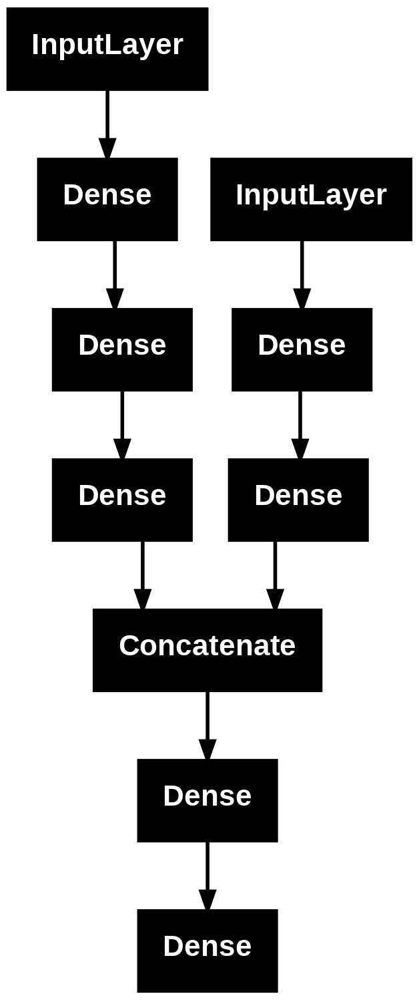

In [2]:
from keras.layers import *
from keras.models import Model

# define two sets of inputs
inputA = Input(shape=(32,))
inputB = Input(shape=(128,))

# the first branch operates on the first input
x = Dense(8, activation="relu")(inputA)
x1 = Dense(4, activation="relu")(x)

# the second branch opreates on the second input
y = Dense(64, activation="relu")(inputB)
y1 = Dense(32, activation="relu")(y)
y2 = Dense(4, activation="relu")(y1)

# combine the output of the two branches
combined = concatenate([x1, y2])

# apply a FC layer and then a regression prediction on the
# combined outputs
z = Dense(2, activation="relu")(combined)
z1 = Dense(1, activation="linear")(z)

# our model will accept the inputs of the two branches and
# then output a single value
model = Model(inputs=[inputA, inputB], outputs=z1)

from keras.utils import plot_model
plot_model(model)

### Q5:
* (a) What do understand by the term Activation function? Name any 4 Activation functions.
* (b) Differentiate between Data Augmentation and Synthetic Data Approach.
* (c) Define the terms Forward propagation and Backward Propagation in Deep Learning
* (d) Differentiate between Machine Learning &amp; Deep Learning.

#### Q5a:
An activation function adds non-linearity to the model, which helps the network learn complex patterns and relationships in the data. Without activation functions, the neural network would just behave like a linear model, no matter how many layers it has.
Four common activation functions are.
* Relu
* Sigmoid
* Softmax
* Tanh

#### Q5b:
****Data Augmentation****
A technique used to increase the size of the training dataset by making small changes to the existing real data. These changes can include rotating, flipping, cropping, scaling, or changing brightness of the original images. It helps the model generalize better and prevents overfitting.

*****Synthetic Data Approach*****
It involves creating entirely new data using artificial methods. This data is not collected from the real world but is generated using techniques like computer graphics, simulations, or even AI models. It's especially useful when real data is hard to get or limited.

#### Q5c:
****Forward Propagation****
The process where input data is passed through the neural network layer by layer to get the final output or prediction. At each layer, the data is transformed using weights, biases, and activation functions.

****Backward Propagation****
The process that happens after the prediction is made. The model compares the predicted output with the actual label using a loss function, then calculates the error and sends it backward through the network to update the weights using gradient descent. This helps the model learn and improve over time.

#### Q5d:
****Machine Learning****
A branch of artificial intelligence where computers learn from data to make decisions or predictions without being explicitly programmed. It usually requires manual feature extraction, and models like decision trees, support vector machines, and linear regression are commonly used.

****Deep Learning****
A subset of machine learning that uses artificial neural networks with many layers. It automatically extracts features from raw data and is especially powerful for tasks like image recognition, natural language processing, and speech recognition.

****Q2:**** You are a developer at a startup building an AI-powered traffic monitoring
system. Your team needs a custom-trained object detector to identify different
types of vehicles from road surveillance footage. The available pre-trained YOLOv8 model detects common objects but lacks accuracy for local vehicle types (e.g., rickshaws, vans, and minibuses in your region). To solve this, you’ve been provided with a labeled dataset from Roboflow titled “Custom Vehicles Dataset”, which includes annotated images of various vehicle types relevant to your city.
Your goal is to:
* Import the dataset from Roboflow
* Train YOLOv8 on it
* Test the model on new images/videos
* Analyze its performance

https://universe.roboflow.com/roboflow-100/vehicles-q0x2v/dataset/2

In [1]:
# installing ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 24.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 81.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 66.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 79.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [3]:
import ultralytics
ultralytics.checks()
from ultralytics import YOLO
from IPython.display import Image

Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.5/112.6 GB disk)


In [4]:
# installing roboflow package as we have labeled images using roboflow.com
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 139.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


In [5]:
# importing data set from roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="SfUNNj8bgPWczM5CtlNq")
project = rf.workspace("roboflow-100").project("vehicles-q0x2v")
version = project.version(2)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to vehicles-2 in yolov8:: 100%|██████████| 8128/8128 [00:01<00:00, 6666.42it/s]


In [8]:
import os

# Specify the path to the training image directory
train_image_dir = '/content/vehicles-2/train/images'

# Check if the directory exists
if os.path.exists(train_image_dir):
  # Count the number of files in the directory
  num_images_train = len([f for f in os.listdir(train_image_dir) if os.path.isfile(os.path.join(train_image_dir, f))])
  print(f"Number of images in the training set: {num_images_train}")
else:
  print(f"Training image directory not found at: {train_image_dir}")


# Specify the path to the validation image directory
valid_image_dir = '/content/vehicles-2/valid/images'

# Check if the directory exists
if os.path.exists(valid_image_dir):
  # Count the number of files in the directory
  num_images_valid = len([f for f in os.listdir(valid_image_dir) if os.path.isfile(os.path.join(valid_image_dir, f))])
  print(f"Number of images in the validation set: {num_images_valid}")
else:
  print(f"Validation image directory not found at: {valid_image_dir}")



# Specify the path to the test image directory
test_image_dir = '/content/vehicles-2/test/images'

# Check if the directory exists
if os.path.exists(test_image_dir):
  # Count the number of files in the directory
  num_images_test = len([f for f in os.listdir(test_image_dir) if os.path.isfile(os.path.join(test_image_dir, f))])
  print(f"Number of images in the test set: {num_images_test}")
else:
  print(f"Test image directory not found at: {test_image_dir}")

Number of images in the training set: 2634
Number of images in the validation set: 966
Number of images in the test set: 458


In [9]:
dataset.location

'/content/vehicles-2'

In [12]:
# Train YOLO8 Model
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolov8n.pt" epochs=10 imgsz=640

Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/vehicles-2/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrain

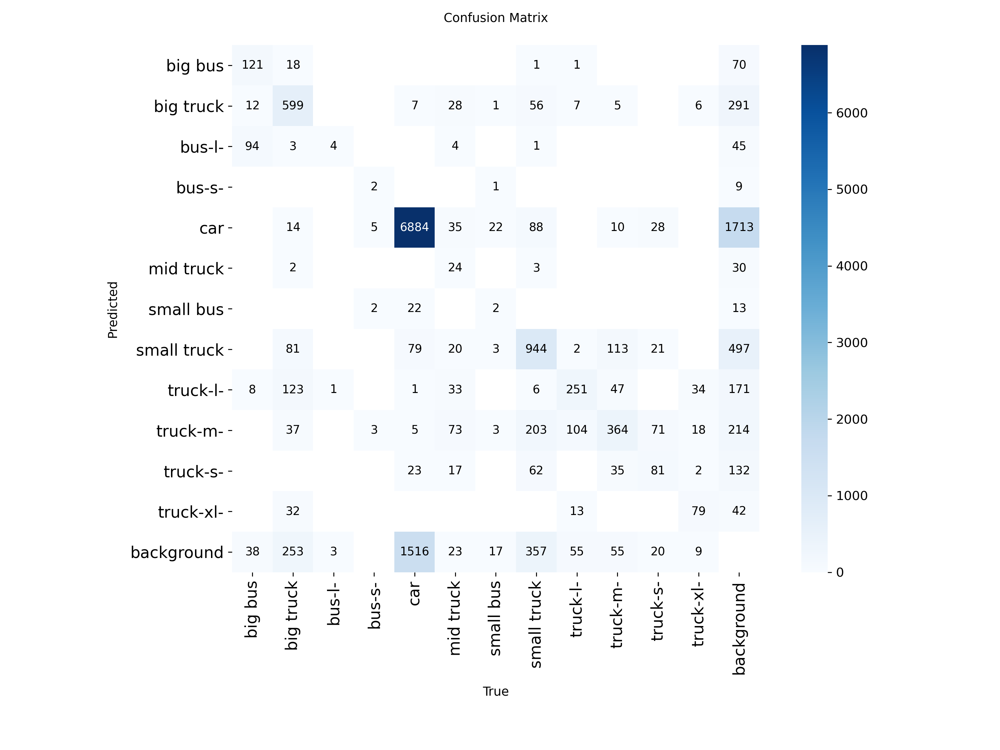

In [13]:
# Examine Training Results
Image("/content/runs/detect/train3/confusion_matrix.png", width=600)

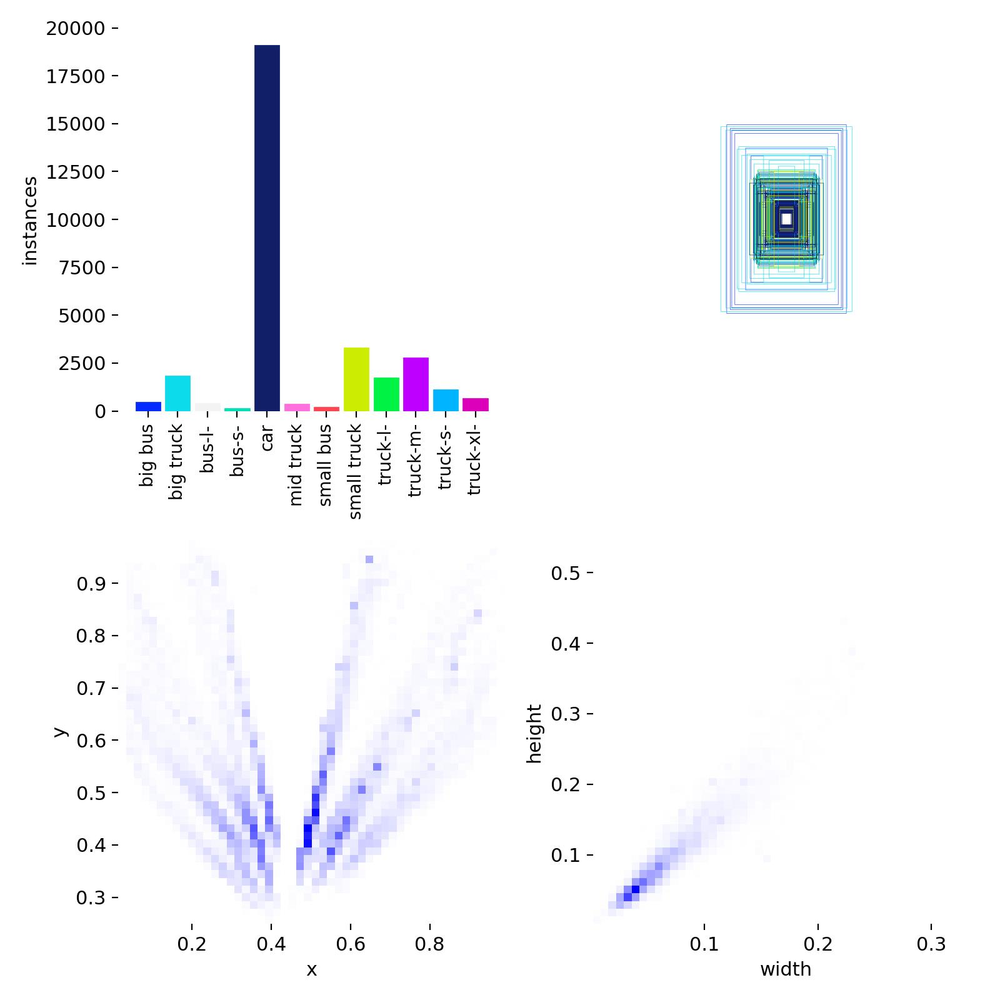

In [14]:
Image("/content/runs/detect/train3/labels.jpg", width=600)

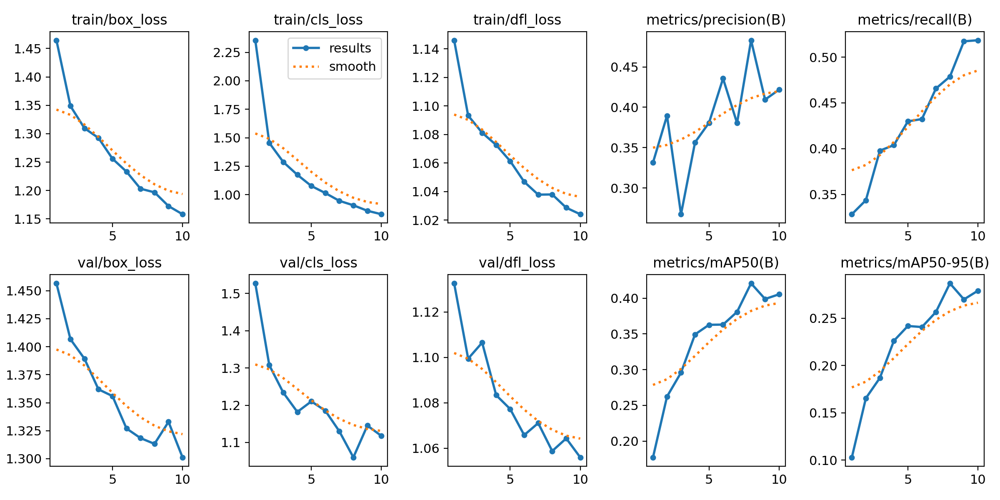

In [15]:
Image("/content/runs/detect/train3/results.png", width=600)

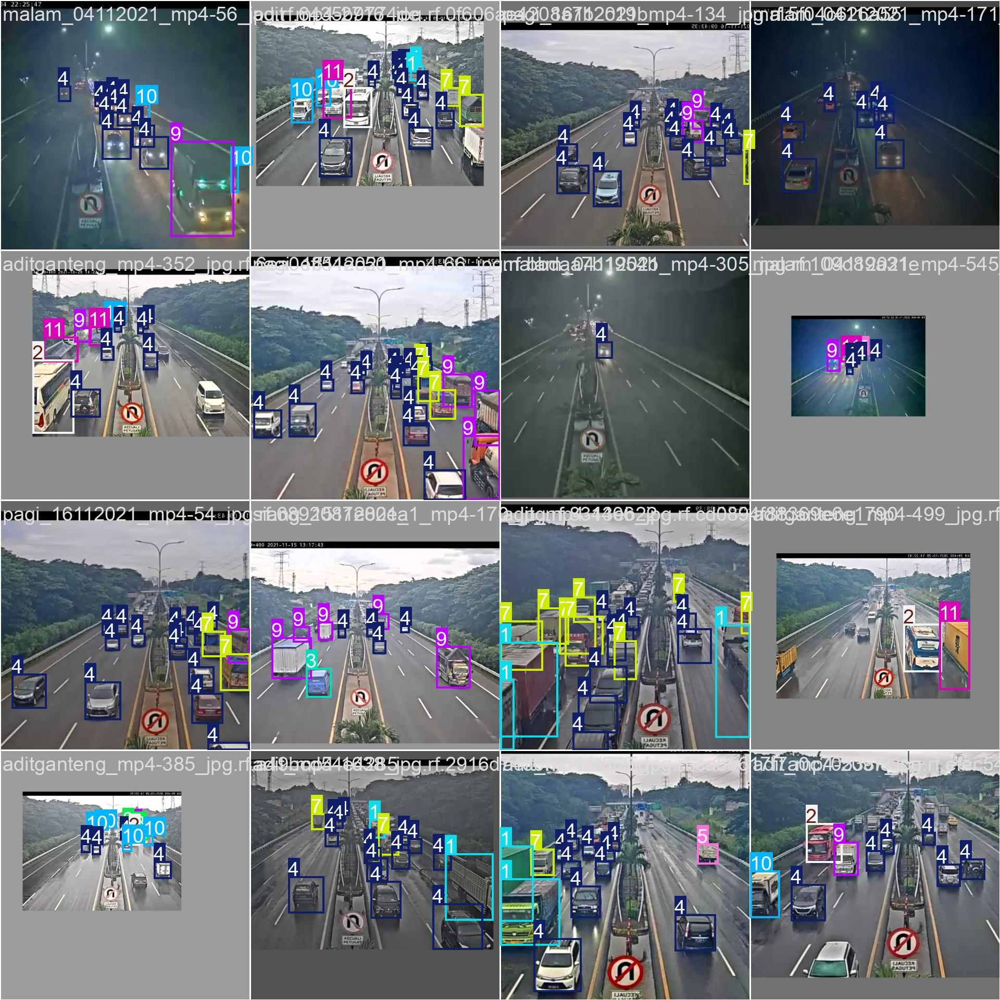

In [16]:
Image("/content/runs/detect/train3/train_batch0.jpg", width=600)

In [18]:
import yaml

data_yaml_path = f"{dataset.location}/data.yaml"

with open(data_yaml_path, 'r') as f:
  data_yaml = yaml.safe_load(f)

class_names = data_yaml.get('names', [])

print("Vehicle labels and names:")
for label, name in enumerate(class_names):
  print(f"Label {label}: {name}")

Vehicle labels and names:
Label 0: big bus
Label 1: big truck
Label 2: bus-l-
Label 3: bus-s-
Label 4: car
Label 5: mid truck
Label 6: small bus
Label 7: small truck
Label 8: truck-l-
Label 9: truck-m-
Label 10: truck-s-
Label 11: truck-xl-


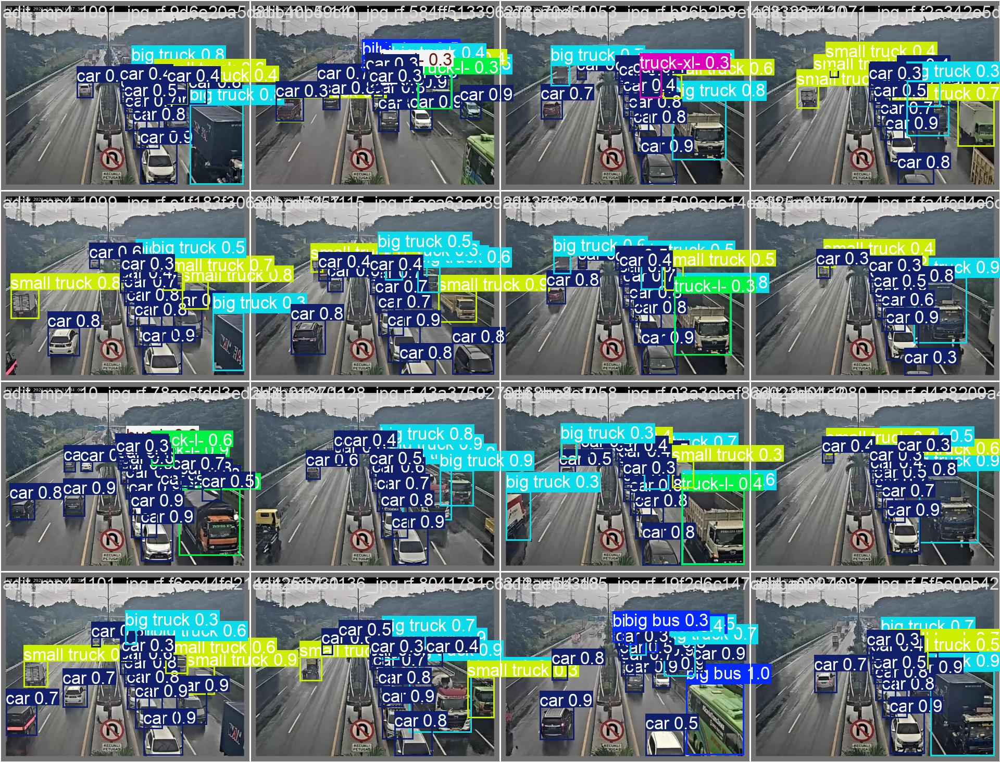

In [19]:
Image("/content/runs/detect/train3/val_batch1_pred.jpg", width=600)

In [20]:
# Validate Fine-Tuned Model
!yolo task=detect mode=val model="/content/runs/detect/train3/weights/best.pt" data={dataset.location}/data.yaml


Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1687.9±609.8 MB/s, size: 48.6 KB)
val: Scanning /content/vehicles-2/valid/labels.cache... 966 images, 3 backgrounds, 0 corrupt: 100% 966/966 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 61/61 [00:10<00:00,  5.67it/s]
                   all        966      13450      0.484      0.478      0.421      0.287
               big bus        210        273      0.763       0.52      0.717      0.526
             big truck        404       1162      0.694      0.558      0.646      0.398
                bus-l-          8          8     0.0244      0.432     0.0199    0.00988
                bus-s-         12         12      0.349      0.333      0.218      0.166
                   car        927       8537      0.794   

In [21]:
# Step # 08 Inference with Custom Model on Images
!yolo task=detect mode=predict model="/content/runs/detect/train3/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs

image 1/458 /content/vehicles-2/test/images/adit_mp4-1002_jpg.rf.5e4018e963af1251b3f7e6fd487c479e.jpg: 480x640 2 big trucks, 11 cars, 1 small truck, 50.2ms
image 2/458 /content/vehicles-2/test/images/adit_mp4-1008_jpg.rf.e20ac34ac20c029e179d9c8bee45a078.jpg: 480x640 4 big trucks, 11 cars, 6.7ms
image 3/458 /content/vehicles-2/test/images/adit_mp4-1022_jpg.rf.8ec648b3f53103ded740458e94ae21f5.jpg: 480x640 1 big bus, 13 cars, 7.5ms
image 4/458 /content/vehicles-2/test/images/adit_mp4-1028_jpg.rf.d9e26a9972e7a6815a2dff1bf35aca60.jpg: 480x640 1 big bus, 11 cars, 6.6ms
image 5/458 /content/vehicles-2/test/images/adit_mp4-1035_jpg.rf.d42b43d55c46df6098b9bd71317b740d.jpg: 480x640 2 big trucks, 10 cars, 1 small truck, 6.2ms
image 6/458 /content/vehicles-2/test/images/adit_mp4-1049_jpg.rf.ddd000b665e067666e7ae5095494e47d.jpg: 480x640 

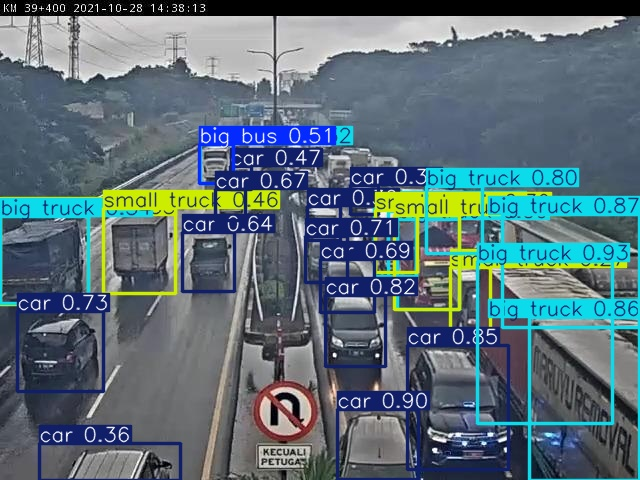

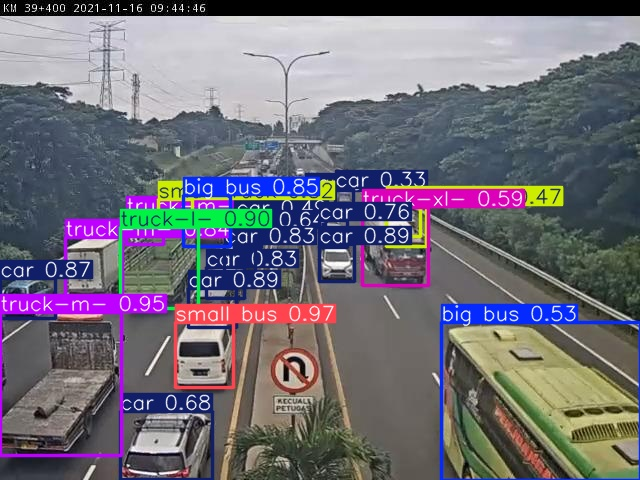

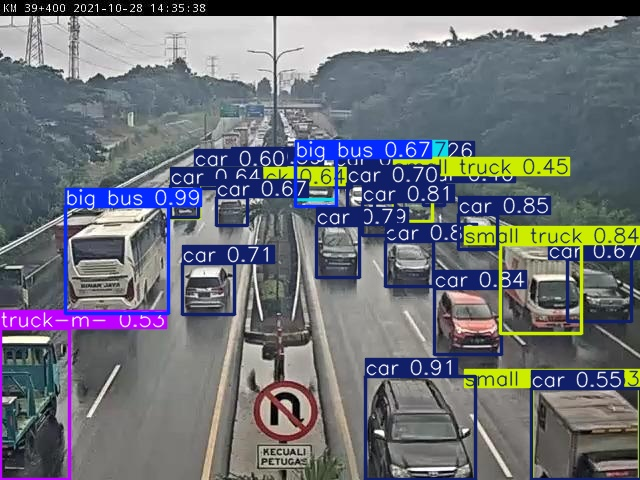

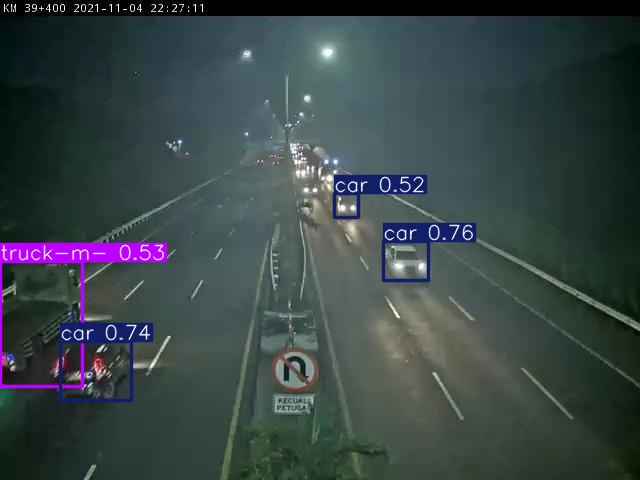

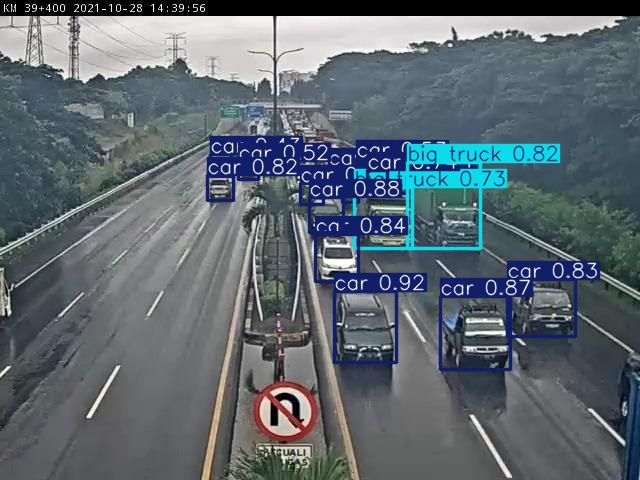

In [22]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:6]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [24]:
!yolo task=detect mode=predict model= "/content/runs/detect/train3/weights/best.pt" conf=0.25 source=image.jpg save=True


Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/image.jpg: 384x640 5 cars, 36.0ms
Speed: 4.0ms preprocess, 36.0ms inference, 157.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


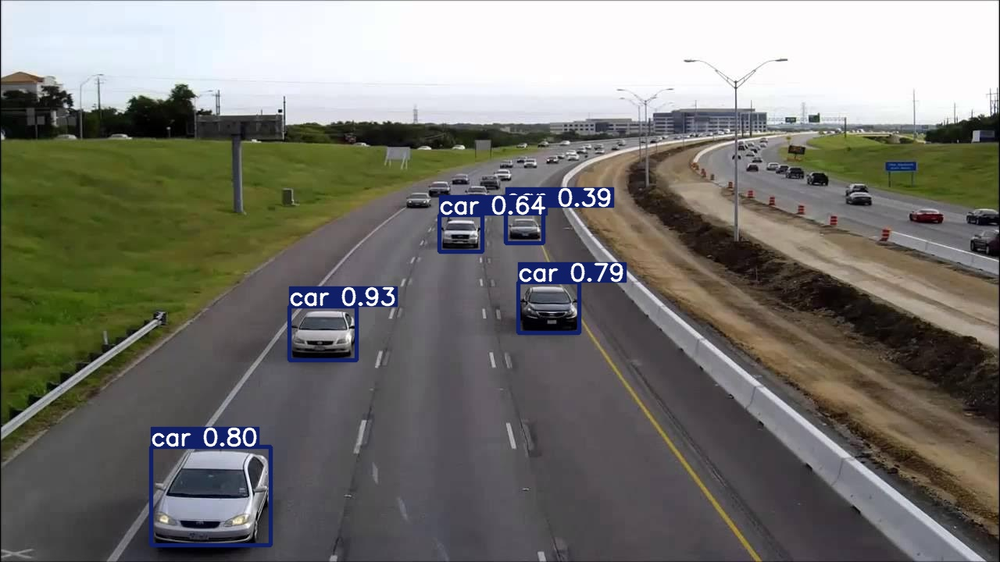

In [25]:
Image("/content/runs/detect/predict2/image.jpg", width=600, embed=True)

In [26]:
!yolo task=detect mode=predict model= "/content/runs/detect/train3/weights/best.pt" conf=0.25 source=image1.jpg save=True


Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/image1.jpg: 320x640 1 big truck, 10 cars, 2 small trucks, 1 truck-m-, 42.2ms
Speed: 2.7ms preprocess, 42.2ms inference, 153.2ms postprocess per image at shape (1, 3, 320, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


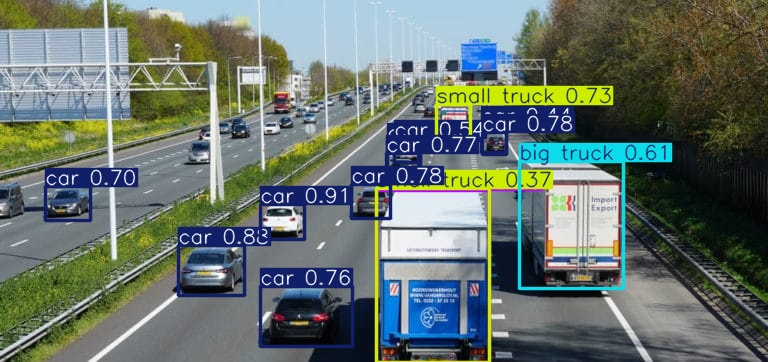

In [27]:
Image("/content/runs/detect/predict3/image1.jpg", width=600, embed=True)

In [43]:
!yolo task=detect mode=predict model= "/content/runs/detect/train3/weights/best.pt" conf=0.25 source="Camera Highway Surveillance.mp4" save=True

Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs

video 1/1 (frame 1/2304) /content/Camera Highway Surveillance.mp4: 384x640 (no detections), 36.1ms
video 1/1 (frame 2/2304) /content/Camera Highway Surveillance.mp4: 384x640 (no detections), 6.6ms
video 1/1 (frame 3/2304) /content/Camera Highway Surveillance.mp4: 384x640 (no detections), 6.4ms
video 1/1 (frame 4/2304) /content/Camera Highway Surveillance.mp4: 384x640 (no detections), 7.1ms
video 1/1 (frame 5/2304) /content/Camera Highway Surveillance.mp4: 384x640 (no detections), 6.8ms
video 1/1 (frame 6/2304) /content/Camera Highway Surveillance.mp4: 384x640 (no detections), 10.4ms
video 1/1 (frame 7/2304) /content/Camera Highway Surveillance.mp4: 384x640 (no detections), 6.6ms
video 1/1 (frame 8/2304) /content/Camera Highway Surveillance.mp4: 384x640 (no detections), 6.7ms
video 1/1 (frame 9/2304) /content/Camera Highway S

In [45]:
# Step 2: Convert .avi output to .mp4 using ffmpeg
import os

# Define paths
input_avi_path = '/content/runs/detect/predict10/Camera Highway Surveillance.avi'  # Update if directory name changes
compressed_mp4_path = '/content/result_compressed.mp4'

# Install ffmpeg if not already available
!apt-get install -y ffmpeg

# Convert AVI to MP4
!ffmpeg -y -i "{input_avi_path}" -vcodec libx264 "{compressed_mp4_path}"

# Step 3: Display the .mp4 video inline
from IPython.display import HTML
from base64 import b64encode

# Read and encode the video
with open(compressed_mp4_path, 'rb') as f:
    mp4 = f.read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

# Display the video in Colab
HTML(f"""
<video width="640" height="480" controls>
  <source src="{data_url}" type="video/mp4">
  Your browser does not support the video tag.
</video>
""")


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq -

#### Key Observations
****Strongest performance:****

car, big bus, and big truck are detected very well, especially cars (with a very high mAP@0.5 of 0.828).

These classes likely have more training samples, clearer patterns, and less variation.

****Weak classes:****

bus-l-, small bus, and bus-s- show very low precision and mAP, suggesting:

These classes may be underrepresented in the dataset.

Their visual features might be confused with each other or other trucks/buses.

****Mid-performance classes:****

Many of the truck variants like truck-l-, truck-m-, and small truck show moderate mAP scores, but varying precision/recall.

Recall is high but precision is low in some (e.g., truck-m-), meaning model is detecting but making more false positives.

****Conclusion****
This fine-tuned YOLOv8 model shows good performance on dominant classes like cars and big trucks, but struggles on rare or ambiguous categories. With some targeted improvements in data balance and labeling, we can raise the model’s overall accuracy and generalization.

